<a href="https://colab.research.google.com/github/aem210/computer-vision-using-deep-learning/blob/main/CNN_LSTM_Model_using_2D_convolutional_layers_.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# CNN - LSTMs for Human Activity Recognition Time Series Classifcation 

Follow code based on https://machinelearningmastery.com/how-to-develop-rnn-models-for-human-activity-recognition-time-series-classification/ 



In [ ]:
!pip install pafy youtube-dl moviepy
!pip install -q imageio
!pip install -q git+https://github.com/tensorflow/docs
# TensorFlow and TF-Hub modules.
from absl import logging

import tensorflow as tf
import tensorflow_hub as hub
from tensorflow_docs.vis import embed

logging.set_verbosity(logging.ERROR)

# Some modules to help with reading the UCF101 dataset.
import random
import re
import os
import tempfile
import ssl
import numpy as np

# Some modules to display an animation using imageio.
import imageio
from IPython import display

from urllib import request  # requires python3

# lstm model
from numpy import mean
from numpy import std
from numpy import dstack
from pandas import read_csv

from matplotlib import pyplot

#intro to video classification and human activity tracking install docs 
import cv2
import math
import pafy
import random
import datetime as dt
from moviepy.editor import *
from collections import deque
import matplotlib.pyplot as plt
%matplotlib inline 

from sklearn.model_selection import train_test_split

import keras
from keras import applications
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers
from keras.models import Sequential, Model 
from keras.layers import *
from keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping



from tensorflow.keras.layers import *
from tensorflow.keras.models import Sequential
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.utils import plot_model

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import multilabel_confusion_matrix

# Import Data 


In [ ]:
#NOT: was not able to unrar the datastep so unzipped it on local computer 
#import UCF files then get rid of unneccesary files 
!wget -nc --no-check-certificate https://www.crcv.ucf.edu/data/UCF101/UCF101.rar
!unrar x UCF101.rar -inul -y 
#delete unnecessary direcotries 
import shutil
shutil.rmtree('UCF-101/Archery')
shutil.rmtree('UCF-101/BabyCrawling')
shutil.rmtree('UCF-101/BalanceBeam')
shutil.rmtree('UCF-101/BandMarching')
shutil.rmtree('UCF-101/BaseballPitch')
shutil.rmtree('UCF-101/Basketball')
shutil.rmtree('UCF-101/BasketballDunk')
shutil.rmtree('UCF-101/BenchPress')
shutil.rmtree('UCF-101/Biking')
shutil.rmtree('UCF-101/Billiards')
shutil.rmtree('UCF-101/BlowingCandles')
shutil.rmtree('UCF-101/BodyWeightSquats')
shutil.rmtree('UCF-101/Bowling')
shutil.rmtree('UCF-101/BoxingPunchingBag')
shutil.rmtree('UCF-101/BoxingSpeedBag')
shutil.rmtree('UCF-101/BreastStroke')
shutil.rmtree('UCF-101/CleanAndJerk')
shutil.rmtree('UCF-101/CliffDiving')
shutil.rmtree('UCF-101/CricketBowling')
shutil.rmtree('UCF-101/CricketShot')
shutil.rmtree('UCF-101/CuttingInKitchen')
shutil.rmtree('UCF-101/Diving')
shutil.rmtree('UCF-101/Drumming')
shutil.rmtree('UCF-101/Fencing')
shutil.rmtree('UCF-101/FieldHockeyPenalty')
shutil.rmtree('UCF-101/FloorGymnastics')
shutil.rmtree('UCF-101/FrisbeeCatch')
shutil.rmtree('UCF-101/FrontCrawl')
shutil.rmtree('UCF-101/GolfSwing')
shutil.rmtree('UCF-101/Haircut')
shutil.rmtree('UCF-101/Hammering')
shutil.rmtree('UCF-101/HammerThrow')
shutil.rmtree('UCF-101/HandstandPushups')
shutil.rmtree('UCF-101/HandstandWalking')
shutil.rmtree('UCF-101/HeadMassage')
shutil.rmtree('UCF-101/HighJump')
shutil.rmtree('UCF-101/HorseRace')
shutil.rmtree('UCF-101/HorseRiding')
shutil.rmtree('UCF-101/HulaHoop')
shutil.rmtree('UCF-101/IceDancing')
shutil.rmtree('UCF-101/JavelinThrow')
shutil.rmtree('UCF-101/JugglingBalls')
shutil.rmtree('UCF-101/JumpingJack')
shutil.rmtree('UCF-101/JumpRope')
shutil.rmtree('UCF-101/Kayaking')
shutil.rmtree('UCF-101/Knitting')
shutil.rmtree('UCF-101/LongJump')
shutil.rmtree('UCF-101/Lunges')
shutil.rmtree('UCF-101/MilitaryParade')
shutil.rmtree('UCF-101/Mixing')
shutil.rmtree('UCF-101/MoppingFloor')
shutil.rmtree('UCF-101/Nunchucks')
shutil.rmtree('UCF-101/ParallelBars')
shutil.rmtree('UCF-101/PizzaTossing')
shutil.rmtree('UCF-101/PlayingCello')
shutil.rmtree('UCF-101/PlayingDaf')
shutil.rmtree('UCF-101/PlayingDhol')
shutil.rmtree('UCF-101/PlayingFlute')
shutil.rmtree('UCF-101/PlayingGuitar')
shutil.rmtree('UCF-101/PlayingPiano')
shutil.rmtree('UCF-101/PlayingSitar')
shutil.rmtree('UCF-101/PlayingTabla')
shutil.rmtree('UCF-101/PlayingViolin')
shutil.rmtree('UCF-101/PoleVault')
shutil.rmtree('UCF-101/PommelHorse')
shutil.rmtree('UCF-101/PullUps')
shutil.rmtree('UCF-101/Punch')
shutil.rmtree('UCF-101/PushUps')
shutil.rmtree('UCF-101/Rafting')
shutil.rmtree('UCF-101/RockClimbingIndoor'	)
shutil.rmtree('UCF-101/RopeClimbing')
shutil.rmtree('UCF-101/Rowing')
shutil.rmtree('UCF-101/SalsaSpin'	)
shutil.rmtree('UCF-101/ShavingBeard'	)
shutil.rmtree('UCF-101/Shotput'	)
shutil.rmtree('UCF-101/SkateBoarding')
shutil.rmtree('UCF-101/Skiing')
shutil.rmtree('UCF-101/Skijet')
shutil.rmtree('UCF-101/SkyDiving'	)
shutil.rmtree('UCF-101/SoccerJuggling')
shutil.rmtree('UCF-101/SoccerPenalty')
shutil.rmtree('UCF-101/StillRings'	)
shutil.rmtree('UCF-101/SumoWrestling'	)
shutil.rmtree('UCF-101/Surfing')
shutil.rmtree('UCF-101/Swing'	)
shutil.rmtree('UCF-101/TableTennisShot'	)
shutil.rmtree('UCF-101/TaiChi'	)
shutil.rmtree('UCF-101/TennisSwing'	)
shutil.rmtree('UCF-101/ThrowDiscus'	)
shutil.rmtree('UCF-101/TrampolineJumping'	)
shutil.rmtree('UCF-101/Typing'	)
shutil.rmtree('UCF-101/UnevenBars'	)
shutil.rmtree('UCF-101/VolleyballSpiking'	)
shutil.rmtree('UCF-101/WalkingWithDog'	)
shutil.rmtree('UCF-101/WallPushups'	)
shutil.rmtree('UCF-101/WritingOnBoard'	)
shutil.rmtree('UCF-101/YoYo'	)


File ‘UCF101.rar’ already there; not retrieving.



#Helper code for Videos and UCF 

In [ ]:
# Helper functions for the UCF101 dataset - this is from the Tensor Flow Example 

# Utilities to fetch videos from UCF101 dataset
UCF_ROOT = "https://www.crcv.ucf.edu/THUMOS14/UCF101/UCF101/"
_VIDEO_LIST = None
_CACHE_DIR = tempfile.mkdtemp()
# As of July 2020, crcv.ucf.edu doesn't use a certificate accepted by the
# default Colab environment anymore.
unverified_context = ssl._create_unverified_context()

def list_ucf_videos():
  """Lists videos available in UCF101 dataset."""
  global _VIDEO_LIST
  if not _VIDEO_LIST:
    index = request.urlopen(UCF_ROOT, context=unverified_context).read().decode("utf-8")
    videos = re.findall("(v_[\w_]+\.avi)", index)
    _VIDEO_LIST = sorted(set(videos))
  return list(_VIDEO_LIST)

def fetch_ucf_video(video):
  """Fetchs a video and cache into local filesystem."""
  cache_path = os.path.join(_CACHE_DIR, video)
  if not os.path.exists(cache_path):
    urlpath = request.urljoin(UCF_ROOT, video)
    print("Fetching %s => %s" % (urlpath, cache_path))
    data = request.urlopen(urlpath, context=unverified_context).read()
    open(cache_path, "wb").write(data)
  return cache_path

# Utilities to open video files using CV2
def crop_center_square(frame):
  y, x = frame.shape[0:2]
  min_dim = min(y, x)
  start_x = (x // 2) - (min_dim // 2)
  start_y = (y // 2) - (min_dim // 2)
  return frame[start_y:start_y+min_dim,start_x:start_x+min_dim]
def load_video(path, max_frames=0, resize=(224, 224)):
  cap = cv2.VideoCapture(path)
  frames = []
  try:
    while True:
      ret, frame = cap.read()
      if not ret:
        break
      frame = crop_center_square(frame)
      frame = cv2.resize(frame, resize)
      frame = frame[:, :, [2, 1, 0]]
      frames.append(frame)
      
      if len(frames) == max_frames:
        break
  finally:
    cap.release()
  return np.array(frames) / 255.0

def to_gif(images):
  converted_images = np.clip(images * 255, 0, 255).astype(np.uint8)
  imageio.mimsave('./animation.gif', converted_images, fps=25)
  return embed.embed_file('./animation.gif')

# Reading and Preprocessing the Data

We need to preprocess the dataset as we are using a classifcation architecture to train on a video classification 
#dataset

Now w constants,

- image_height and image_weight: This is the size we will resize all frames of the video to, we're doing this to - avoid unneccsary computation.

- max_images_per_class: Maximum number of training images allowed for each class.

- dataset_directory: The path of the directory containing the extracted dataset.

- classes_list: These are the list of classes we're going to be training on, we're traninng on following 4 classes, you can feel free to change it.

        - apply eye makeup 
        - apply lipstick 
        - blow dry hair 
        - brush teeth 
Note: The image_height, image_weight and max_images_per_class constants may be increased for better results, but be warned this will become computationally expensive.

In [ ]:
#Assign Heights and widths to our data 

image_height, image_width = 48, 48
max_images_per_class = 100

dataset_directory = "UCF-101"
classes_list = ["ApplyEyeMakeup", "ApplyLipstick", "BrushingTeeth", "BlowDryHair"]
model_output_size = len(classes_list)


**Extract, Resize & Normalize Frames**

Create a function that extracts the frames from each video while performing other preprocessing operations like resizing and normal images.
This method takes the video file as an input. it then reads the video frame by frame into a list, and then finally returns that list

In [ ]:
def frames_extraction(video_path):
    frames_list = []
     
    video_reader = cv2.VideoCapture(video_path)
    # Used as counter variable 
    count = 1
 
    while count <= max_images_per_class: 
         
        # Reading a frame from the video file 
        success, image = video_reader.read() 
        
        if success:
            # Resize the Frame to fixed Dimensions
            image = cv2.resize(image, (image_height, image_width))
            
            # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
            normalized_frame = image / 255

            # Appending the normalized frame into the frames list
            frames_list.append(normalized_frame)
            count += 1
        else:
            print("Defected frame")
            break
 
            
    return frames_list

# Dataset Creation
Now we'll create another function called create_dataset(), this function uses the frames_extraction() function above and creates our final preprocessed dataset.

Here's how this function works:

1. Iterate through all the classes mentioned in the classes_list
2. Now for each class iterate through all the video files present in it.
3. Call the frame_extraction method on each video file.
4. Add the returned frames to a list called temp_features
5. After all videos of a class are processed, randomly select video frames (equal to max_images_per_class) and add them to the list called features.
6. Add labels of the selected videos to the labels list.
7. After all videos of all classes are processed then return the features and labels as numpy arrays.

So when you call this function, it returns 2 lists:

    - a list of feature vectors
    - a list of it's associated labels.

In [ ]:
def create_dataset(input_dir):
    features = []
    labels = []
     
     # Iterating through all the classes mentioned in the classes list
    classes_list = os.listdir(input_dir)
     
    for c in classes_list:
        print(c)
        # Getting the list of video files present in the specific class name directory
        files_list = os.listdir(os.path.join(input_dir, c))

        # Iterating through all the files present in the files list
        for f in files_list:
        
            # Calling the frame_extraction method for every video file path
            frames = frames_extraction(os.path.join(os.path.join(input_dir, c), f))
            
            if len(frames) == max_images_per_class:
                
                 # Appending the frames to a temporary list.
                features.append(frames)
                
                # Adding Fixed number of labels to the labels list
                y = [0]*len(classes_list)
                y[classes_list.index(c)] = 1
                labels.append(y)
    
    # Converting the features and labels lists to arrays
    features = np.asarray(features)
    labels = np.asarray(labels)
    return features, labels

In [ ]:
features, labels = create_dataset(dataset_directory)

ApplyLipstick
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
BrushingTeeth
Defected frame
Defected frame
BlowDryHair
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
ApplyEyeMakeup
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame
Defected frame


In [ ]:
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size = 0.2, shuffle = True, random_state = 0) 

# Create Model

In [ ]:
# define model using Sequential 
# model includes 2 2d convolutional layers 
model = Sequential()
model.add(TimeDistributed(Conv2D(filters=32, kernel_size=3, activation='relu'), input_shape =(max_images_per_class, image_height, image_width, 3)))
model.add(TimeDistributed(Conv2D(filters=32, kernel_size=3, activation='relu')))
model.add(TimeDistributed(Dropout(0.5)))
model.add(TimeDistributed(MaxPooling2D(pool_size=2)))
model.add(TimeDistributed(Flatten()))
model.add(LSTM(100))
model.add(Dropout(0.5))
model.add(Dense(100, activation='relu'))
model.add(Dense(model_output_size, activation='softmax'))
 

model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
time_distributed (TimeDistri (None, 100, 46, 46, 32)   896       
_________________________________________________________________
time_distributed_1 (TimeDist (None, 100, 44, 44, 32)   9248      
_________________________________________________________________
time_distributed_2 (TimeDist (None, 100, 44, 44, 32)   0         
_________________________________________________________________
time_distributed_3 (TimeDist (None, 100, 22, 22, 32)   0         
_________________________________________________________________
time_distributed_4 (TimeDist (None, 100, 15488)        0         
_________________________________________________________________
lstm (LSTM)                  (None, 100)               6235600   
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)               0

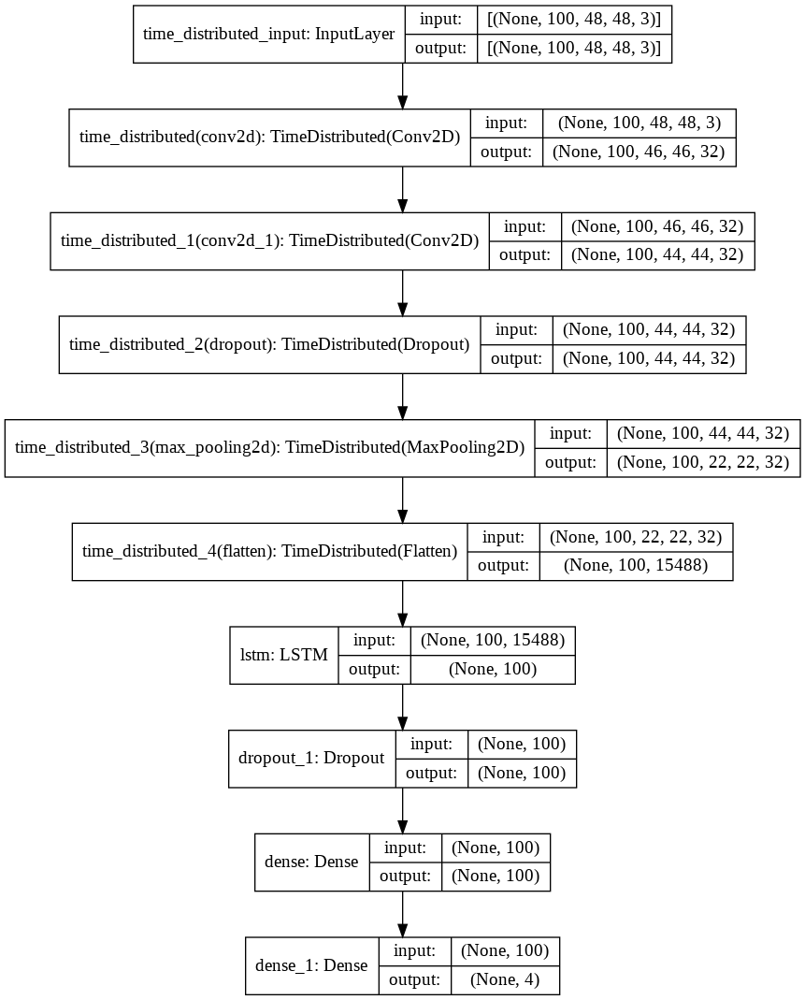

In [ ]:
plot_model(model, show_shapes = True, show_layer_names = True)

#Compile the Model 

In [ ]:
# Adding the Early Stopping Callback to the model which will continuously monitor the validation loss metric for every epoch.
# If the models validation loss does not decrease after 15 consecutive epochs, the training will be stopped and the weight which reported the lowest validation loss will be retored in the model.
early_stopping_callback = EarlyStopping(monitor = 'val_loss', patience = 15, mode = 'min', restore_best_weights = True)
callbacks = [early_stopping_callback]

model.compile(loss='categorical_crossentropy', optimizer='Adam', metrics=['accuracy'])


#Train the Model 

In [ ]:
#Train the model 
model_training_history = model.fit(features_train, labels_train, epochs=40, batch_size = 8 , shuffle=True, validation_split=0.2, callbacks=callbacks)


Epoch 1/40
39/39 [==============================] - 255s 6s/step - loss: 1.4434 - accuracy: 0.3032 - val_loss: 1.3546 - val_accuracy: 0.3462
Epoch 2/40
39/39 [==============================] - 251s 6s/step - loss: 1.2899 - accuracy: 0.3774 - val_loss: 1.1294 - val_accuracy: 0.4615
Epoch 3/40
39/39 [==============================] - 252s 6s/step - loss: 0.9831 - accuracy: 0.6194 - val_loss: 0.8779 - val_accuracy: 0.6923
Epoch 4/40
39/39 [==============================] - 266s 7s/step - loss: 0.7855 - accuracy: 0.6839 - val_loss: 0.7658 - val_accuracy: 0.6923
Epoch 5/40
39/39 [==============================] - 264s 7s/step - loss: 0.6009 - accuracy: 0.7677 - val_loss: 0.6083 - val_accuracy: 0.7949
Epoch 6/40
39/39 [==============================] - 260s 7s/step - loss: 0.4618 - accuracy: 0.8516 - val_loss: 0.5209 - val_accuracy: 0.8077
Epoch 7/40
39/39 [==============================] - 258s 7s/step - loss: 0.3176 - accuracy: 0.8871 - val_loss: 0.5387 - val_accuracy: 0.8077
Epoch 8/40
39

KeyboardInterrupt: ignored

In [ ]:
#Evaluating Your Trained Model - Evaluate your trained model on the feature's and label's test sets.
model_evaluation_history = model.evaluate(features_test, labels_test)

4/4 [==============================] - 12s 2s/step - loss: 1.0832 - accuracy: 0.7959


In [ ]:
#save the model 
# Creating a useful name for our model, incase you're saving multiple models (OPTIONAL)
date_time_format = '%Y_%m_%d__%H_%M_%S'
current_date_time_dt = dt.datetime.now()
current_date_time_string = dt.datetime.strftime(current_date_time_dt, date_time_format)
model_evaluation_loss, model_evaluation_accuracy = model_evaluation_history
model_name = f'Model___Date_Time_{current_date_time_string}___Loss_{model_evaluation_loss}___Accuracy_{model_evaluation_accuracy}.h5'

# Saving your Model
model.save(model_name) 

# **Step 8: Make Predictions with the Model:**
Now that we have created and trained our model it's time to test it's performance on some test videos.

**Function to Download Youtube videos:**
Let's start by testing on some youtube videos, this function will use pafy librar to download any youtube video and return it's title. You just need to pass the URL.  

In [ ]:
def download_youtube_videos(youtube_video_url, output_directory):
    # Creating a Video object which includes useful information regarding the youtube video.
    video = pafy.new(youtube_video_url)

    # Getting the best available quality object for the youtube video.
    video_best = video.getbest()

    # Constructing the Output File Path
    output_file_path = f'{output_directory}/{video.title}.mp4'

    # Downloading the youtube video at the best available quality.
    video_best.download(filepath = output_file_path, quiet = True)

    # Returning Video Title
    return video.title

In [ ]:
# prediction function
def predict(video):
  # Add a batch axis to the to the sample video.
  # model_input = tf.constant(sample_video, dtype=tf.float32)[tf.newaxis, ...]

  probabilities = model.predict(video) 

  predicted_label_index = np.argmax(probabilities)

  predicted_class_name = classes_list[predicted_label_index]
  
  predicted_probability = np.max(probabilities)

  print("CLASS NAME:", predicted_class_name,  "PROBABILITY:", predicted_probability*100)
  
  


In [ ]:
# Creating The Output directories if it does not exist
output_directory = 'Youtube_Videos'
os.makedirs(output_directory, exist_ok = True)

# Downloading a YouTube Video
video_title =  download_youtube_videos('https://www.youtube.com/watch?v=WrUpeZ52A6E', output_directory)


# Getting the YouTube Video's path you just downloaded
input_video_file_path = f'{output_directory}/{video_title}.mp4'

video = load_video(input_video_file_path, max_frames=100, resize=(48, 48))

video = np.expand_dims(video, axis = 0)

classes_list = np.array(classes_list)
predict(video)


CLASS NAME: ApplyEyeMakeup PROBABILITY: 99.85421895980835


In [118]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=sbZbBfAIadc', output_directory)

input_video_file_path = f'{output_directory}/{video_title}.mp4'

video = load_video(input_video_file_path, max_frames=500, resize=(48, 48))

model_input = tf.constant(video, dtype=tf.float32)[tf.newaxis, ...]

predict(model_input)


# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)


CLASS NAME: BrushingTeeth PROBABILITY: 99.83855485916138


100%|██████████| 947/947 [00:13<00:00, 70.15it/s]


In [119]:
# Downloading The YouTube Video
video_title = download_youtube_videos('https://www.youtube.com/watch?v=yspBuYeYOb0', output_directory)

input_video_file_path = f'{output_directory}/{video_title}.mp4'

video = load_video(input_video_file_path, max_frames=500, resize=(48, 48))

model_input = tf.constant(video, dtype=tf.float32)[tf.newaxis, ...]

predict(model_input)

# Play Video File in the Notebook
#VideoFileClip(input_video_file_path).ipython_display(width = 700)



CLASS NAME: ApplyLipstick PROBABILITY: 99.98319149017334


#  Using Single-Frame CNN Method:
 Now let's create a function that will output a singular prediction for the complete video, now this function will take n frames from the entire video and make predictions. In the end, it will average the predictions of those n frames to give you the final activity class for that video. You can set the value of n using the predictions_frames_count variable.

This function is useful when you have a video containing one activity and you want to know the activity's name and its score. 

In [ ]:
def make_average_predictions(video_file_path, predictions_frames_count):
    
    # Initializing the Numpy array which will store Prediction Probabilities
    predicted_labels_probabilities_np = np.zeros((predictions_frames_count, model_output_size), dtype = np.float)

    # Reading the Video File using the VideoCapture Object
    video_reader = cv2.VideoCapture(video_file_path)

    # Getting The Total Frames present in the video 
    video_frames_count = int(video_reader.get(cv2.CAP_PROP_FRAME_COUNT))

    # Calculating The Number of Frames to skip Before reading a frame
    skip_frames_window = video_frames_count // predictions_frames_count

    for frame_counter in range(predictions_frames_count): 

        # Setting Frame Position
        video_reader.set(cv2.CAP_PROP_POS_FRAMES, frame_counter * skip_frames_window)

        # Reading The Frame
        _ , frame = video_reader.read() 

        # Resize the Frame to fixed Dimensions
        resized_frame = cv2.resize(frame, (image_height, image_width))
        
        # Normalize the resized frame by dividing it with 255 so that each pixel value then lies between 0 and 1
        normalized_frame = resized_frame / 255
        np.expand_dims(normalized_frame, axis = 0)

        # Passing the Image Normalized Frame to the model and receiving Predicted Probabilities.
        predicted_labels_probabilities = model.predict(np.expand_dims(normalized_frame, axis = 0))[0]

        # Appending predicted label probabilities to the deque object
        predicted_labels_probabilities_np[frame_counter] = predicted_labels_probabilities

    # Calculating Average of Predicted Labels Probabilities Column Wise 
    predicted_labels_probabilities_averaged = predicted_labels_probabilities_np.mean(axis = 0)

    # Sorting the Averaged Predicted Labels Probabilities
    predicted_labels_probabilities_averaged_sorted_indexes = np.argsort(predicted_labels_probabilities_averaged)[::-1]

    # Iterating Over All Averaged Predicted Label Probabilities
    for predicted_label in predicted_labels_probabilities_averaged_sorted_indexes:

        # Accessing The Class Name using predicted label.
        predicted_class_name = classes_list[predicted_label]

        # Accessing The Averaged Probability using predicted label.
        predicted_probability = predicted_labels_probabilities_averaged[predicted_label]

        print(f"CLASS NAME: {predicted_class_name}   AVERAGED PROBABILITY: {(predicted_probability*100):.2}")
    
    # Closing the VideoCapture Object and releasing all resources held by it. 
    video_reader.release()

In [116]:
#try it on the data - likely that it was trained on this so the predictions will be very acurate unlike with youtube
selected_class_Name = random.choice(classes_list)

video_files_names_list = os.listdir(f'UCF-101/{selected_class_Name}')

selected_video_file_name = random.choice(video_files_names_list)


input_video_file_path = f'UCF-101/{selected_class_Name}/{selected_video_file_name}'


video = load_video(input_video_file_path, max_frames=100, resize=(48, 48))

video = np.expand_dims(video, axis = 0)

predict(video)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)

CLASS NAME: ApplyLipstick PROBABILITY: 99.56032037734985


100%|█████████▉| 291/292 [00:00<00:00, 728.92it/s]


In [117]:
#try it on the data - likely that it was trained on this so the predictions will be very acurate unlike with youtube
selected_class_Name = random.choice(classes_list)

video_files_names_list = os.listdir(f'UCF-101/{selected_class_Name}')

selected_video_file_name = random.choice(video_files_names_list)


input_video_file_path = f'UCF-101/{selected_class_Name}/{selected_video_file_name}'

video = load_video(input_video_file_path, max_frames=100, resize=(48, 48))

video = np.expand_dims(video, axis = 0)

predict(video)

# Play Video File in the Notebook
VideoFileClip(input_video_file_path).ipython_display(width = 700)

CLASS NAME: ApplyEyeMakeup PROBABILITY: 51.38118863105774


 99%|█████████▉| 198/199 [00:00<00:00, 572.10it/s]
